In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
from sklearn.preprocessing import StandardScaler 
import numpy as np

In [2]:
data = pd.read_csv("jfk_weather_cleaned.csv")

In [3]:
data.head()

,DATE,VISIBILITY,DRYBULBTEMPF,WETBULBTEMPF,DewPointTempF,RelativeHumidity,WindSpeed,WindDirection,StationPressure,SeaLevelPressure,Precip
0,2010-01-01 00:51:00,6.0,33,32,31,92,0,0,29.97,29.99,0.01
1,2010-01-01 01:51:00,6.0,33,33,32,96,0,0,29.97,29.99,0.02
2,2010-01-01 02:51:00,5.0,33,33,32,96,0,0,29.97,29.99,0.02
3,2010-01-01 03:51:00,5.0,33,33,32,96,0,0,29.95,29.97,0.02
4,2010-01-01 04:51:00,5.0,33,32,31,92,0,0,29.93,29.96,0.02


In [4]:
data.isna().sum()

DATE                0
VISIBILITY          0
DRYBULBTEMPF        0
WETBULBTEMPF        0
DewPointTempF       0
RelativeHumidity    0
WindSpeed           0
WindDirection       0
StationPressure     0
SeaLevelPressure    0
Precip              0
dtype: int64

In [5]:
data.describe()

,VISIBILITY,DRYBULBTEMPF,WETBULBTEMPF,DewPointTempF,RelativeHumidity,WindSpeed,WindDirection,StationPressure,SeaLevelPressure,Precip
count,75083.000000,75083.000000,75083.000000,75083.000000,75083.000000,75083.000000,75083.000000,75083.000000,75083.000000,75083.000000
mean,9.211896,55.355527,49.327544,42.424024,64.812075,11.253240,196.550751,30.005579,30.026049,0.005478
std,2.202311,17.394334,16.182867,19.577957,19.898962,6.101048,107.692804,0.235172,0.234069,0.036161
min,0.000000,1.000000,-1.000000,-19.000000,8.000000,0.000000,0.000000,28.520000,28.540000,0.000000
25%,10.000000,42.000000,36.000000,27.000000,49.000000,7.000000,110.000000,29.860000,29.880000,0.000000
50%,10.000000,56.000000,50.000000,44.000000,66.000000,10.000000,200.000000,30.000000,30.020000,0.000000
75%,10.000000,70.000000,64.000000,59.000000,82.000000,15.000000,290.000000,30.150000,30.170000,0.000000
max,14.000000,102.000000,85.000000,84.000000,100.000000,53.000000,360.000000,30.830000,30.850000,2.410000


There are no missing values.

In [6]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     / 22.0 MB 71 kB/s
     |████████████████████████████████| 102 kB 5.8 MB/s 
     |████████████████████████████████| 679 kB 27.4 MB/s 
     |████████████████████████████████| 62 kB 1.4 MB/s 
     |████████████████████████████████| 9.9 MB 38.2 MB/s 
     |████████████████████████████████| 4.7 MB 29.0 MB/s 
     |████████████████████████████████| 296 kB 43.2 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-dev-py2.py3-none-any.whl size=324949 sha256=41b966b03398133117eb2b22078ab7fcd63d2f0421ef8b7d8e64f568722ecaa2
  Stored in directory: /tmp/pip-ephem-wheel-cache-ssju8fm9/wheels/64/b6/85/dfc808b23666a5910371784e349d28818006ff63ed9cfeca59
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=e298fa8f2e2bc4ad77396015a5386f3fcf67566d61e61a96c9eff9ab9c3c2789
  Stored in directory: /root/.cache/pip/wheels/23/14/6e/4be5bfeeb027f4939a01764b4

In [7]:
import pandas_profiling
import os
from pandas_profiling import profile_report

In [8]:
df = pd.read_csv('jfk_weather_cleaned.csv')
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

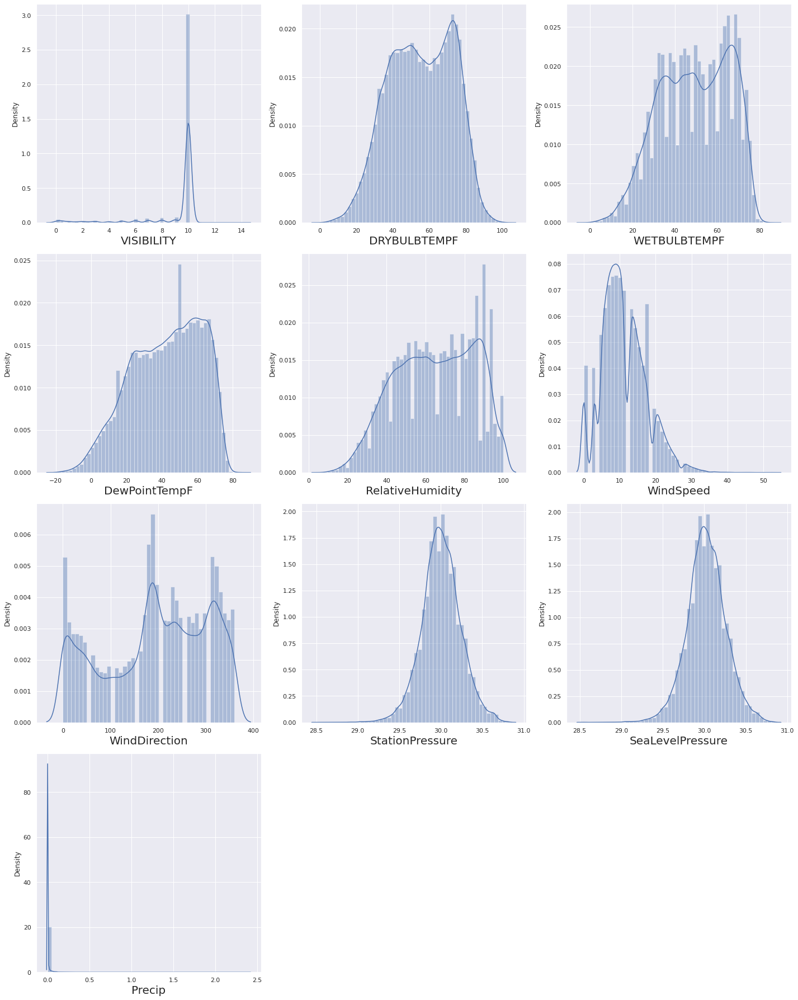

In [9]:
# let's see how data is distributed for every column
plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for column in data.drop(['DATE'],axis=1):
    ax = plt.subplot(4,3,plotnumber)
    sns.distplot(data[column])
    plt.xlabel(column,fontsize=20)
        #plt.ylabel('Salary',fontsize=20)
    plotnumber+=1
plt.tight_layout()

In [10]:
#let's scale our data
scale = StandardScaler()

In [11]:
X = data.drop(['DATE','VISIBILITY'],axis=1)
y = data['VISIBILITY']

In [12]:
X_scaled = scale.fit_transform(X)

In [13]:
X_scaled = pd.DataFrame(X_scaled,columns=X.columns)

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

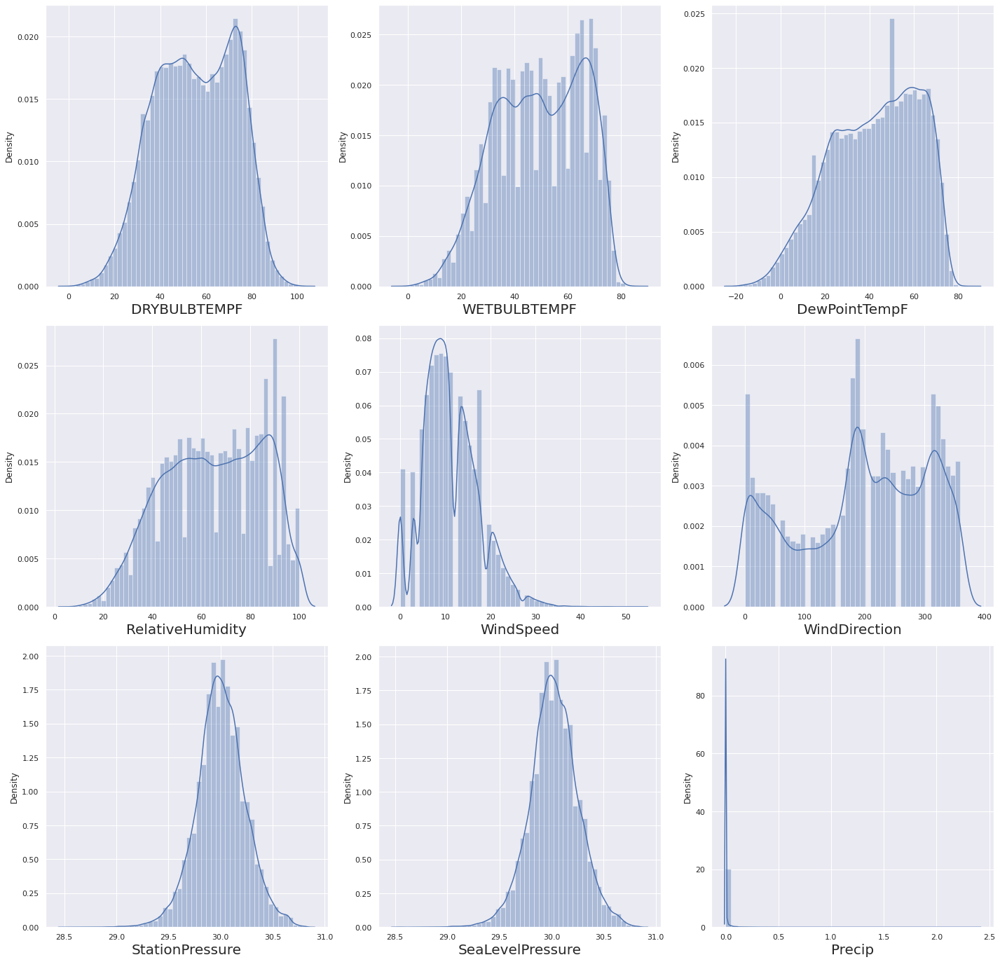

In [14]:
# let's see how data is distributed for every column
plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for column in X:
    ax = plt.subplot(4,3,plotnumber)
    sns.distplot(X[column])
    plt.xlabel(column,fontsize=20)
        #plt.ylabel('Salary',fontsize=20)
    plotnumber+=1
plt.tight_layout()

We can see some columns are not following normal distribution.

we will use such algorithms which do not require normal distribution such as decision tree and XGBoost.

Also, precipitation column has most of data value near 0. It won't be very useful for our analysis. 
Let's drop this column.

Let's check correlation between the columns :

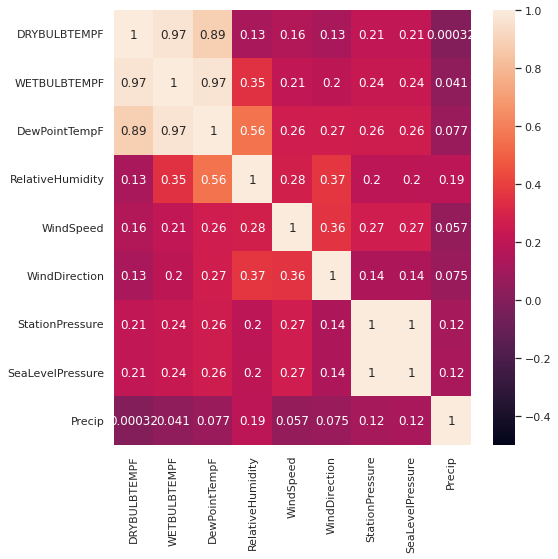

In [15]:
plt.figure(figsize=(8,8))
plt_data =X
    #ax = plot.subplot(5,3,plotnumber)
sns.heatmap(plt_data.corr().abs(), vmin = -0.5,vmax = 1,annot=True) #matplotlib  3.0.3 , ther eis an issue with 3.1.1 , annotation gets cut from top and bottom

#     plot.xlabel(column,fontsize=20)
#     #plt.ylabel('Salary',fontsize=20)
#     plot.ylabel("Calories")
#     plotnumber+=1

There is clear correaltion between some columns.

Let's drop the columns with high correlaion.

In [18]:
X_ = X.drop(['WETBULBTEMPF','DewPointTempF','StationPressure'],axis=1)

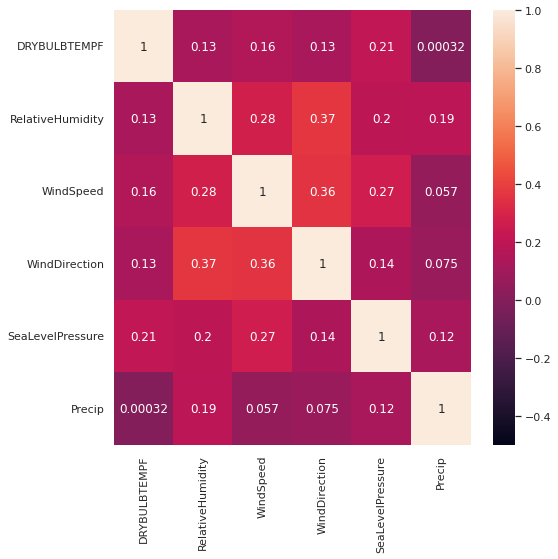

In [19]:
plt.figure(figsize=(8,8))
plt_data = X_
    #ax = plot.subplot(5,3,plotnumber)
sns.heatmap(plt_data.corr().abs(), vmin = -0.5,vmax = 1,annot=True) #matplotlib  3.0.3 , ther eis an issue with 3.1.1 , annotation gets cut from top and bottom

#     plot.xlabel(column,fontsize=20)
#     #plt.ylabel('Salary',fontsize=20)
#     plot.ylabel("Calories")
#     plotnumber+=1

In [20]:
from sklearn.tree import DecisionTreeRegressor

In [21]:
scr = DecisionTreeRegressor()

In [22]:
from sklearn.model_selection import GridSearchCV

In [23]:
param_grid_knn = {"criterion" : ["mse", "friedman_mse", "mae"],
"splitter" : ["best", "random"],
"max_features" :["auto", "sqrt", "log2"],
'max_depth': range(2,16,2),
'min_samples_split': range(2,16,2)    
                 }
    
    

In [24]:
grid =GridSearchCV(scr,param_grid_knn, verbose=3,cv=5)
            # finding the best parameters



In [ ]:
grid.fit(X_, y)

Fitting 5 folds for each of 882 candidates, totalling 4410 fits
[CV 1/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=2, splitter=best;, score=0.481 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=2, splitter=best;, score=0.494 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=2, splitter=best;, score=0.489 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=2, splitter=best;, score=0.445 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=2, splitter=best;, score=0.077 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=2, splitter=random;, score=0.199 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=2, splitter=random;, score=0.193 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=2, splitter=random;, score=0.188 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=2, splitter=random;, score=0.004 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=2, splitter=random;, score=-0.006 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=4, splitter=best;, score=0.481 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=4, splitter=bes

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=4, splitter=best;, score=0.489 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=4, splitter=best;, score=0.445 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=4, splitter=best;, score=0.077 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=4, splitter=random;, score=0.057 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=4, splitter=random;, score=0.049 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=4, splitter=random;, score=0.355 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=4, splitter=random;, score=0.244 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=4, splitter=random

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=6, splitter=best;, score=0.481 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=6, splitter=best;, score=0.494 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=6, splitter=best;, score=0.489 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=6, splitter=best;, score=0.445 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=6, splitter=best;, score=0.077 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=6, splitter=random;, score=0.060 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=6, splitter=random;, score=0.336 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=6, splitter=random;, score=0.140 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=6, splitter=random;, score=0.049 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=6, splitter=random;, score=0.089 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=8, splitter=best;, score=0.481 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=8, splitter=best;, score=0.494 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=8, splitter=best;, score=0.489 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 4/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=8, splitter=best;, score=0.445 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=8, splitter=best;, score=0.077 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=8, splitter=random;, score=0.055 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=8, splitter=random;, score=0.408 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=8, splitter=random;, score=0.157 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=8, splitter=random;, score=0.052 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=8, splitter=random;, score=0.129 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=10, splitter=bes

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=10, splitter=best;, score=0.494 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=10, splitter=best;, score=0.489 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=10, splitter=best;, score=0.445 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=10, splitter=best;, score=0.077 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=10, splitter=random;, score=0.155 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=10, splitter=random;, score=0.458 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=10, splitter=random;, score=0.285 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=10, splitter=

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=10, splitter=random;, score=0.067 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=12, splitter=best;, score=0.481 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=12, splitter=best;, score=0.494 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=12, splitter=best;, score=0.489 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=12, splitter=best;, score=0.445 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=12, splitter=best;, score=0.077 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=12, splitter=random;, score=0.426 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=12, splitter=random;, score=0.487 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=12, splitter=random;, score=0.329 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=12, splitter=random;, score=0.316 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=12, splitter=random;, score=0.046 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=14, splitter=best;, score=0.481 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=14, split

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=14, splitter=best;, score=0.489 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=14, splitter=best;, score=0.445 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=14, splitter=best;, score=0.077 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=14, splitter=random;, score=0.037 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=14, splitter=random;, score=0.389 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=14, splitter=random;, score=0.443 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=14, splitter=random;, score=0.378 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=auto, min_samples_split=14, splitte

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.480 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.317 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.367 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.281 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.010 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.014 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.046 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=2, splitter=random;,

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.309 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.395 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.264 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.176 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.009 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.021 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.246 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=4, splitter=random

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 4/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.075 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.266 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.312 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.246 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.063 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.363 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.003 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=8, splitter=best

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.125 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.048 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.221 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.053 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.014 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.034 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.070 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=10, splitter=be

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.034 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.064 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.042 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.024 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.079 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.421 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.065 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=12, split

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.007 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.028 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.039 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=12, splitter=random;, score=-0.002 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.038 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.263 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.255 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=14, spli

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.036 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.360 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=14, splitter=random;, score=-0.000 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.013 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.133 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=2, splitter=best;, score=0.476 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=2, splitter=best;, score=0.118 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=2, splitte

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=2, splitter=random;, score=0.039 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=2, splitter=random;, score=0.014 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=2, splitter=random;, score=0.022 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=2, splitter=random;, score=0.078 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=4, splitter=best;, score=0.143 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=4, splitter=best;, score=0.460 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=4, splitter=best;, score=0.436 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=4, splitter=best;,

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=4, splitter=random;, score=0.361 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=4, splitter=random;, score=0.009 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=4, splitter=random;, score=0.007 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=4, splitter=random;, score=0.092 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=6, splitter=best;, score=0.468 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=6, splitter=best;, score=0.060 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=6, splitter=best;, score=0.437 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=6, splitter=best;,

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=6, splitter=random;, score=0.394 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=6, splitter=random;, score=0.124 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=6, splitter=random;, score=-0.007 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=6, splitter=random;, score=0.033 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=8, splitter=best;, score=0.481 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=8, splitter=best;, score=0.069 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=8, splitter=best;, score=0.486 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=8, splitter=best;

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=8, splitter=random;, score=0.003 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=8, splitter=random;, score=0.024 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=8, splitter=random;, score=0.067 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=10, splitter=best;, score=0.201 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=10, splitter=best;, score=0.461 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=10, splitter=best;, score=0.055 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=10, splitter=best;, score=0.426 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=10, splitter=bes

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 4/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=10, splitter=random;, score=-0.003 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=10, splitter=random;, score=0.039 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=12, splitter=best;, score=0.481 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=12, splitter=best;, score=0.200 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=12, splitter=best;, score=0.512 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=12, splitter=best;, score=0.426 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=12, splitter=best;, score=0.207 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=12, splitter=r

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=12, splitter=random;, score=0.024 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=14, splitter=best;, score=0.449 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=14, splitter=best;, score=0.535 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=14, splitter=best;, score=0.440 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=14, splitter=best;, score=0.237 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=14, splitter=best;, score=0.254 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=14, splitter=random;, score=0.174 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=2, max_features=log2, min_samples_split=14, splitter=ra

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=2, splitter=best;, score=0.546 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=2, splitter=best;, score=0.021 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=2, splitter=random;, score=0.410 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=2, splitter=random;, score=0.297 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=2, splitter=random;, score=0.351 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=2, splitter=random;, score=0.446 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=2, splitter=random;, score=0.151 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=4, splitter=best;, score=0.563 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=4, splitter=best;, score=0.575 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=4, splitter=best;, score=0.598 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=4, splitter=best;, score=0.546 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=4, splitter=best;, score=0.021 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=4, splitter=random;, score=0.274 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=4, splitter=random;, score=0.358 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=4, splitter=random;, score=0.405 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=4, splitter=random;, score=0.447 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=4, splitter=random;, score=-0.012 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=6, splitter=best;, score=0.563 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=6, splitter=best;, score=0.575 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=6, splitter=best;, score=0.598 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=6, splitter=best;, score=0.546 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=6, splitter=best;, score=0.021 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=6, splitter=random;, score=0.407 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=6, splitter=random;, score=0.512 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=6, splitter=random;, score=0.342 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=6, splitter=random;, score=0.387 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=6, splitter=random;, score=0.018 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=8, splitter=best;, score=0.563 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=8, splitter=best;, score=0.575 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=8, splitter=best;, score=0.598 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=8, splitter=best;, score=0.546 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=8, splitter=best;, score=0.021 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 1/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=8, splitter=random;, score=0.452 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=8, splitter=random;, score=0.531 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=8, splitter=random;, score=0.397 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=8, splitter=random;, score=0.225 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=8, splitter=random;, score=-0.114 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=10, splitter=best;, score=0.563 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=10, splitter=best;, score=0.575 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=10, splitter=best;, score=0.598 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=10, splitter=best;, score=0.546 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=10, splitter=best;, score=0.021 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 1/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=10, splitter=random;, score=0.410 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=10, splitter=random;, score=0.277 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=10, splitter=random;, score=0.245 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=10, splitter=random;, score=0.339 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=10, splitter=random;, score=-0.065 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=12, splitter=best;, score=0.563 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=12, splitter=best;, score=0.575 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=12, splitter=best;, score=0.598 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=12, splitter=best;, score=0.546 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=12, splitter=best;, score=0.021 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 1/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=12, splitter=random;, score=0.181 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=12, splitter=random;, score=0.388 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=12, splitter=random;, score=0.351 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=12, splitter=random;, score=0.307 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=12, splitter=random;, score=-0.025 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=14, splitter=best;, score=0.563 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=14, splitter=best;, score=0.575 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=14, splitter=best;, score=0.598 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=14, splitter=best;, score=0.546 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=14, splitter=best;, score=0.021 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=14, splitter=random;, score=0.234 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=14, splitter=random;, score=0.508 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=14, splitter=random;, score=0.508 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=14, splitter=random;, score=0.347 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=auto, min_samples_split=14, splitter=random;, score=0.195 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.525 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.426 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=2, splitter

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 4/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.273 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.304 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.334 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.442 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.202 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=2, splitter=random;, score=-0.007 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=2, splitter=random;, score=-0.048 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=4, splitter=be

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.517 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.496 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.506 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.469 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.234 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.019 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.210 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=6, splitter=random;, s

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 4/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.121 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.227 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.499 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.472 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.435 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.483 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.206 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=8, splitter=random;, s

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.070 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.209 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.318 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.223 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.429 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.498 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.498 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=10, splitter=be

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.181 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.289 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.013 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.122 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.176 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.264 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.443 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=12, split

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 4/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.326 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=12, splitter=best;, score=-0.027 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.170 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.474 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.057 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.150 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.132 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=14, spli

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.568 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.329 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.478 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.144 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.075 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.096 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.078 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=sqrt, min_samples_split=14, splitter=

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=2, splitter=best;, score=0.539 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=2, splitter=best;, score=0.542 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=2, splitter=best;, score=0.538 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=2, splitter=best;, score=0.475 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=2, splitter=best;, score=0.185 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=2, splitter=random;, score=0.075 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=2, splitter=random;, score=0.020 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=2, splitter=random;, score=0.161 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=2, splitter=random;, score=0.086 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=2, splitter=random;, score=0.043 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=4, splitter=best;, score=0.429 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=4, splitter=best;, score=0.511 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=4, splitter=best;, score=0.499 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=4, splitter=best;, score=0.486 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=4, splitter=best;, s

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=4, splitter=random;, score=0.399 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=4, splitter=random;, score=0.196 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=4, splitter=random;, score=0.017 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=4, splitter=random;, score=0.413 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=4, splitter=random;, score=0.073 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=6, splitter=best;, score=0.522 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=6, splitter=best;, score=0.448 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=6, splitter=best

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=6, splitter=best;, score=0.197 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=6, splitter=random;, score=0.115 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=6, splitter=random;, score=0.348 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=6, splitter=random;, score=0.430 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=6, splitter=random;, score=0.185 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=6, splitter=random;, score=0.060 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=8, splitter=best;, score=0.498 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=8, splitter=best

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 4/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=8, splitter=best;, score=0.149 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=8, splitter=best;, score=0.219 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=8, splitter=random;, score=0.115 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=8, splitter=random;, score=0.066 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=8, splitter=random;, score=0.171 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=8, splitter=random;, score=0.017 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=8, splitter=random;, score=-0.038 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=10, splitter=be

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=10, splitter=best;, score=0.422 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=10, splitter=best;, score=0.517 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=10, splitter=best;, score=0.236 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=10, splitter=random;, score=0.129 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=10, splitter=random;, score=0.190 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=10, splitter=random;, score=0.229 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=10, splitter=random;, score=0.374 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=10, splitte

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=12, splitter=best;, score=0.522 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=12, splitter=best;, score=0.476 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=12, splitter=best;, score=0.294 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=12, splitter=best;, score=0.280 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=12, splitter=random;, score=0.440 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=12, splitter=random;, score=0.106 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=12, splitter=random;, score=0.095 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=12, splitter=

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=14, splitter=best;, score=0.364 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=14, splitter=best;, score=0.404 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=14, splitter=best;, score=0.450 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=14, splitter=best;, score=0.303 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=14, splitter=best;, score=0.297 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=14, splitter=random;, score=0.413 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=14, splitter=random;, score=0.011 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=14, splitter=ra

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 4/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=14, splitter=random;, score=-0.000 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=4, max_features=log2, min_samples_split=14, splitter=random;, score=0.236 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=2, splitter=best;, score=0.563 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=2, splitter=best;, score=0.558 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=2, splitter=best;, score=0.616 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=2, splitter=best;, score=0.538 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=2, splitter=best;, score=0.110 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=2, splitter=random;, score=0.472 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=2, splitter=random;, score=0.561 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=2, splitter=random;, score=0.493 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=2, splitter=random;, score=0.442 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=2, splitter=random;, score=-0.020 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=4, splitter=best;, score=0.563 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=4, splitter=best;, score=0.558 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=4, splitter=best;, score=0.616 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=4, splitter=best;, score=0.538 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=4, splitter=best;, score=0.110 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=4, splitter=random;, score=0.517 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=4, splitter=random;, score=0.547 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=4, splitter=random;, score=0.465 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 4/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=4, splitter=random;, score=0.415 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=4, splitter=random;, score=-0.031 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=6, splitter=best;, score=0.563 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=6, splitter=best;, score=0.557 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=6, splitter=best;, score=0.616 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=6, splitter=best;, score=0.538 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=6, splitter=best;, score=0.110 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=6, splitter=random;, score=0.522 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=6, splitter=random;, score=0.539 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=6, splitter=random;, score=0.489 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=6, splitter=random;, score=0.471 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=6, splitter=random;, score=-0.004 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=8, splitter=best;, score=0.563 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=8, splitter=best;, score=0.557 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=8, splitter=best;, score=0.616 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=8, splitter=best;, score=0.538 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=8, splitter=best;, score=0.113 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=8, splitter=random;, score=0.388 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=8, splitter=random;, score=0.520 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=8, splitter=random;, score=0.456 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=8, splitter=random;, score=0.470 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=8, splitter=random;, score=-0.024 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=10, splitter=best;, score=0.563 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=10, splitter=best;, score=0.557 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=10, splitter=best;, score=0.616 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=10, splitter=best;, score=0.538 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=10, splitter=best;, score=0.113 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=10, splitter=random;, score=0.517 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=10, splitter=random;, score=0.485 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=10, splitter=random;, score=0.391 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=10, splitter=random;, score=0.466 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=10, splitter=random;, score=0.016 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=12, splitter=best;, score=0.563 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=12, splitter=best;, score=0.557 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=12, split

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=12, splitter=best;, score=0.539 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=12, splitter=best;, score=0.113 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=12, splitter=random;, score=0.396 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=12, splitter=random;, score=0.557 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=12, splitter=random;, score=0.542 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=12, splitter=random;, score=0.511 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=12, splitter=random;, score=-0.076 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=14, splitter=best;, score=0.563 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=14, splitter=best;, score=0.557 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=14, splitter=best;, score=0.616 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=14, splitter=best;, score=0.539 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=14, splitter=best;, score=0.113 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 1/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=14, splitter=random;, score=0.421 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=14, splitter=random;, score=0.453 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=14, splitter=random;, score=0.480 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=14, splitter=random;, score=0.440 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=auto, min_samples_split=14, splitter=random;, score=0.134 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.528 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.546 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.543 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.455 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.022 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.361 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.291 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.143 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.047 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=2, splitter=random

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.562 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.522 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.574 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.502 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.218 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.314 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.381 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.344 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.432 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.092 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.415 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.496 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.428 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 4/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.488 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.189 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.261 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.181 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.251 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.095 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.208 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=8, splitter=best

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.554 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.490 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.518 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.243 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.380 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.278 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.449 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=8, splitter=random;,

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.005 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.515 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.492 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.580 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.442 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.238 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.372 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.516 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.189 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.301 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.208 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.531 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=12, split

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.611 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.494 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.218 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.211 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.300 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.405 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.253 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=12, splitte

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.517 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.559 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.578 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.498 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.187 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.155 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.170 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.294 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.211 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.093 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=2, splitter=best;, score=0.536 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=2, splitter=best;, score=0.562 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=2, splitter=best;, score=0.561 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 4/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=2, splitter=best;, score=0.502 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=2, splitter=best;, score=0.055 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=2, splitter=random;, score=0.357 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=2, splitter=random;, score=0.324 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=2, splitter=random;, score=0.475 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=2, splitter=random;, score=0.251 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=2, splitter=random;, score=0.241 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=4, splitter=best

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=4, splitter=random;, score=0.272 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=4, splitter=random;, score=0.172 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=4, splitter=random;, score=0.091 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=6, splitter=best;, score=0.548 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=6, splitter=best;, score=0.542 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=6, splitter=best;, score=0.501 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=6, splitter=best;, score=0.526 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=6, splitter=best;, s

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=8, splitter=best;, score=0.539 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=8, splitter=best;, score=0.603 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=8, splitter=best;, score=0.530 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=8, splitter=best;, score=0.128 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=8, splitter=random;, score=0.303 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=8, splitter=random;, score=0.117 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=8, splitter=random;, score=0.352 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=8, splitter=random;,

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=8, splitter=random;, score=0.257 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=10, splitter=best;, score=0.560 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=10, splitter=best;, score=0.533 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=10, splitter=best;, score=0.491 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=10, splitter=best;, score=0.478 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=10, splitter=best;, score=-0.003 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=10, splitter=random;, score=0.263 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=10, splitter=random;, score=0.401 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=10, splitter=random;, score=0.183 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=10, splitter=random;, score=0.239 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=10, splitter=random;, score=0.054 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=12, splitter=best;, score=0.475 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=12, spli

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=12, splitter=best;, score=0.542 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=12, splitter=best;, score=0.523 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=12, splitter=best;, score=0.224 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=12, splitter=random;, score=0.268 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=12, splitter=random;, score=0.300 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=12, splitter=random;, score=0.193 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=12, splitter=random;, score=0.218 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=12, splitte

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=14, splitter=best;, score=0.412 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=14, splitter=best;, score=0.559 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=14, splitter=best;, score=0.543 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=14, splitter=best;, score=0.496 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=14, splitter=best;, score=0.292 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=14, splitter=random;, score=0.205 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=14, splitter=random;, score=0.185 total time=   0.0s

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 


[CV 3/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=14, splitter=random;, score=0.239 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=14, splitter=random;, score=0.278 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=6, max_features=log2, min_samples_split=14, splitter=random;, score=0.102 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=2, splitter=best;, score=0.541 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=2, splitter=best;, score=0.559 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=2, splitter=best;, score=0.593 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=2, splitter=best;, score=0.532 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=2, splitter=best;, score=-0.012 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=2, splitter=random;, score=0.528 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=2, splitter=random;, score=0.581 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=2, splitter=random;, score=0.519 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=2, splitter=random;, score=0.522 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=2, splitter=random;, score=0.010 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=4, splitter=best;, score=0.542 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=4, splitter=best;, score=0.555 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=4, splitter=best;, score=0.591 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=4, splitter=best;, score=0.531 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=4, splitter=best;, score=0.016 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=4, splitter=random;, score=0.548 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=4, splitter=random;, score=0.536 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=4, splitter=random;, score=0.566 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=4, splitter=random;, score=0.534 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=4, splitter=random;, score=0.076 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=6, splitter=best;, score=0.540 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=6, splitter=best;, score=0.558 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=6, splitter=best;, score=0.600 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=6, splitter=best;, score=0.531 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=6, splitter=best;, score=-0.012 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=6, splitter=random;, score=0.489 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=6, splitter=random;, score=0.569 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=6, splitter=random;, score=0.528 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=6, splitter=random;, score=0.478 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=6, splitter=random;, score=0.062 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=8, splitter=best;, score=0.543 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=8, splitter=best;, score=0.555 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=8, splitter=best;, score=0.602 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=8, splitter=best;, score=0.532 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=8, splitter=best;, score=0.020 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=8, splitter=random;, score=0.539 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=8, splitter=random;, score=0.572 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=8, splitter=random;, score=0.573 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=8, splitter=random;, score=0.449 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=8, splitter=random;, score=0.007 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=10, splitter=best;, score=0.544 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=10, splitter=best;, score=0.559 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=10, splitter=best;, score=0.602 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=10, splitter=best;, score=0.531 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=10, splitter=best;, score=0.020 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=10, splitter=random;, score=0.543 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=10, splitter=random;, score=0.550 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=10, splitter=random;, score=0.559 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=10, splitter=random;, score=0.517 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=10, splitter=random;, score=0.089 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=12, splitter=best;, score=0.545 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=12, splitter=best;, score=0.558 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=12, splitter=best;, score=0.602 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=12, splitter=best;, score=0.533 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=12, splitter=best;, score=0.021 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=12, splitter=random;, score=0.534 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=12, splitter=random;, score=0.575 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=12, splitter=random;, score=0.500 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=12, splitter=random;, score=0.425 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=12, splitter=random;, score=-0.056 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=14, splitter=best;, score=0.542 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=14, splitter=best;, score=0.558 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=14, splitter=best;, score=0.602 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=14, splitter=best;, score=0.533 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=14, splitter=best;, score=0.022 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=14, splitter=random;, score=0.503 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=14, splitter=random;, score=0.572 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=14, splitter=random;, score=0.607 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=14, splitter=random;, score=0.481 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=auto, min_samples_split=14, splitter=random;, score=0.036 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.553 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.403 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.538 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.495 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.079 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.381 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.537 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.103 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.289 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.132 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.513 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.552 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.576 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.470 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=4, splitter=best;, score=-0.007 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.422 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.402 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.363 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.250 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.055 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.534 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.532 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.593 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.531 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.046 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.323 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.482 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.367 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.219 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.087 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.531 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.584 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.531 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 4/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.535 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.113 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.487 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.322 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.329 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.332 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.270 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 1/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.482 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.535 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.588 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.538 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.155 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.236 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.392 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.272 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.367 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.169 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.513 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.523 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.580 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.497 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.028 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.297 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.389 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.354 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.204 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.160 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.532 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.389 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.580 total time=   0.0s

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 


[CV 4/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.510 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.109 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.214 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.281 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.317 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 4/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.196 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.212 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=2, splitter=best;, score=0.501 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=2, splitter=best;, score=0.539 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=2, splitter=best;, score=0.546 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 4/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=2, splitter=best;, score=0.515 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=2, splitter=best;, score=0.091 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=2, splitter=random;, score=0.306 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=2, splitter=random;, score=0.388 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=2, splitter=random;, score=0.098 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=2, splitter=random;, score=0.265 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=2, splitter=random;, score=0.228 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 1/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=4, splitter=best;, score=0.507 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=4, splitter=best;, score=0.559 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=4, splitter=best;, score=0.571 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=4, splitter=best;, score=0.512 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=4, splitter=best;, score=0.148 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=4, splitter=random;, score=0.443 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=4, splitter=random;, score=0.225 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=4, splitter=random;, score=0.438 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=4, splitter=random;, score=0.375 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=4, splitter=random;, score=0.271 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=6, splitter=best;, score=0.536 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=6, splitter=best;, score=0.569 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=6, splitter=best;, score=0.570 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=6, splitter=best;, score=0.509 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=6, splitter=best;, score=0.146 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=6, splitter=random;, score=0.428 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=6, splitter=random;, score=0.505 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=6, splitter=random;, score=0.375 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=6, splitter=random;, score=0.116 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=6, splitter=random;, score=0.273 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=8, splitter=best;, score=0.527 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=8, splitter=best;, score=0.526 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=8, splitter=best;, score=0.543 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=8, splitter=best;, score=0.524 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=8, splitter=best;, score=0.089 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=8, splitter=random;, score=0.211 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=8, splitter=random;, score=0.143 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=8, splitter=random;, score=0.252 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=8, splitter=random;, score=0.442 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=8, splitter=random;, score=0.245 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=10, splitter=best;, score=0.506 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=10, splitter=best;, score=0.544 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=10, splitter=best;, score=0.560 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=10, splitter=best;, score=0.525 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=10, splitter=best;, score=0.233 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=10, splitter=random;, score=0.341 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=10, splitter=random;, score=0.242 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=10, splitter=random;, score=0.271 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=10, splitter=random;, score=0.330 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=10, splitter=random;, score=0.124 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=12, splitter=best;, score=0.476 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=12, splitter=best;, score=0.558 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=12, splitter=best;, score=0.582 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=12, splitter=best;, score=0.530 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=12, splitter=best;, score=-0.000 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=12, splitter=random;, score=0.425 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=12, splitter=random;, score=0.169 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=12, splitter=random;, score=0.466 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=12, splitter=random;, score=0.112 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=12, splitter=random;, score=0.214 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=14, splitter=best;, score=0.537 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=14, splitter=best;, score=0.509 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=14, splitter=best;, score=0.550 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=14, splitter=best;, score=0.511 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=14, splitter=best;, score=0.053 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=14, splitter=random;, score=0.273 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=14, splitter=random;, score=0.517 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=14, splitter=random;, score=0.213 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=14, splitter=random;, score=0.128 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=8, max_features=log2, min_samples_split=14, splitter=random;, score=0.171 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=2, splitter=best;, score=0.508 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=2, splitter=best;, score=0.484 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=2, splitter=best;, score=0.553 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=2, splitter=best;, score=0.504 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=2, splitter=best;, score=-0.022 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=2, splitter=random;, score=0.515 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=2, splitter=random;, score=0.567 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=2, splitter=random;, score=0.568 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=2, splitter=random;, score=0.532 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=2, splitter=random;, score=-0.045 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 1/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=4, splitter=best;, score=0.509 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=4, splitter=best;, score=0.488 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=4, splitter=best;, score=0.553 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=4, splitter=best;, score=0.508 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=4, splitter=best;, score=-0.055 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=4, splitter=random;, score=0.537 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=4, splitter=random;, score=0.579 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=4, splitter=random;, score=0.561 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=4, splitter=random;, score=0.523 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=4, splitter=random;, score=-0.041 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=6, splitter=best;, score=0.510 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=6, splitter=best;, score=0.493 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=6, splitter=best;, score=0.573 total time=   0.2s
[CV 4/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=6, splitter=best;, score=0.511 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=6, splitter=best;, score=-0.043 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=6, splitter=random;, score=0.521 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=6, splitter=random;, score=0.568 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=6, splitter=random;, score=0.520 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=6, splitter=random;, score=0.489 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=6, splitter=random;, score=-0.007 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=8, splitter=best;, score=0.511 total time=   0.2s
[CV 2/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=8, splitter=best;, score=0.491 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=8, splitter=best;, score=0.577 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=8, splitter=best;, score=0.508 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=8, splitter=best;, score=-0.014 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=8, splitter=random;, score=0.552 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=8, splitter=random;, score=0.539 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=8, splitter=random;, score=0.569 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=8, splitter=random;, score=0.454 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=8, splitter=random;, score=-0.019 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=10, splitter=best;, score=0.515 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=10, splitter=best;, score=0.495 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=10, splitter=best;, score=0.577 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=10, splitter=best;, score=0.509 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=10, splitter=best;, score=-0.026 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=10, splitter=random;, score=0.537 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=10, splitter=random;, score=0.548 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=10, splitter=random;, score=0.586 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=10, splitter=random;, score=0.496 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=10, splitter=random;, score=-0.015 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 1/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=12, splitter=best;, score=0.515 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=12, splitter=best;, score=0.500 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=12, splitter=best;, score=0.578 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=12, splitter=best;, score=0.511 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=12, splitter=best;, score=-0.015 total time=   0.2s
[CV 1/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=12, splitter=random;, score=0.538 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=12, splitter=random;, score=0.535 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=12, splitter=random;, score=0.547 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=12, splitter=random;, score=0.490 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=12, splitter=random;, score=0.097 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=14, splitter=best;, score=0.512 total time=   0.2s
[CV 2/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=14, splitter=best;, score=0.502 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=14, splitter=best;, score=0.579 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=14, splitter=best;, score=0.512 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=14, splitter=best;, score=-0.004 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=14, splitter=random;, score=0.511 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=14, splitter=random;, score=0.565 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=14, splitter=random;, score=0.597 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=14, splitter=random;, score=0.523 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=10, max_features=auto, min_samples_split=14, splitter=random;, score=-0.028 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.519 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.539 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.556 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.501 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.057 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.457 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.375 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.426 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.283 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.275 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.500 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.501 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.573 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.492 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.136 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.429 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.302 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.317 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.470 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.147 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.500 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.496 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.539 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.466 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.175 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.333 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.456 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.337 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.470 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.036 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.504 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.495 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.555 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.509 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.184 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.380 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.295 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.402 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.361 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.124 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.501 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.529 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.543 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.502 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.084 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.338 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.324 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.533 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.392 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.113 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.496 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.518 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.563 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.456 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.022 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.425 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.421 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.273 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.257 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.194 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.480 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.507 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.584 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.514 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.074 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.344 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.476 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.377 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.249 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=10, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.119 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=2, splitter=best;, score=0.507 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=2, splitter=best;, score=0.521 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=2, splitter=best;, score=0.555 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=2, splitter=best;, score=0.512 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=2, splitter=best;, score=0.004 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=2, splitter=random;, score=0.421 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=2, splitter=random;, score=0.299 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=2, splitter=random;, score=0.284 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 4/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=2, splitter=random;, score=0.311 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=2, splitter=random;, score=0.140 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=4, splitter=best;, score=0.527 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=4, splitter=best;, score=0.515 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=4, splitter=best;, score=0.563 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 4/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=4, splitter=best;, score=0.489 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=4, splitter=best;, score=0.093 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=4, splitter=random;, score=0.244 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=4, splitter=random;, score=0.434 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=4, splitter=random;, score=0.401 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=4, splitter=random;, score=0.379 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=4, splitter=random;, score=0.373 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=6, splitter=best;, score=0.505 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=6, splitter=best;, score=0.538 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=6, splitter=best;, score=0.546 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=6, splitter=best;, score=0.388 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=6, splitter=best;, score=-0.004 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=6, splitter=random;, score=0.250 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=6, splitter=random;, score=0.276 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=6, splitter=random;, score=0.448 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=6, splitter=random;, score=0.455 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=6, splitter=random;, score=0.171 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=8, splitter=best;, score=0.519 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=8, splitter=best;, score=0.490 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=8, splitter=best;, score=0.561 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=8, splitter=best;, score=0.517 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=8, splitter=best;, score=0.065 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 1/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=8, splitter=random;, score=0.277 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=8, splitter=random;, score=0.432 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=8, splitter=random;, score=0.470 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=8, splitter=random;, score=0.262 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=8, splitter=random;, score=0.214 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=10, splitter=best;, score=0.512 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=10, splitter=best;, score=0.479 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=10, splitter=best;, score=0.567 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=10, splitter=best;, score=0.509 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=10, splitter=best;, score=0.202 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=10, splitter=random;, score=0.377 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=10, splitter=random;, score=0.287 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=10, splitter=random;, score=0.360 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=10, splitter=random;, score=0.406 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=10, splitter=random;, score=0.242 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=12, splitter=best;, score=0.498 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=12, splitter=best;, score=0.514 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=12, splitter=best;, score=0.571 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=12, splitter=best;, score=0.509 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=12, splitter=best;, score=0.055 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 1/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=12, splitter=random;, score=0.319 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=12, splitter=random;, score=0.419 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=12, splitter=random;, score=0.342 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=12, splitter=random;, score=0.330 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=12, splitter=random;, score=0.068 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=14, splitter=best;, score=0.504 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=14, splitter=best;, score=0.509 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=14, splitter=best;, score=0.586 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=14, splitter=best;, score=0.512 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=14, splitter=best;, score=0.057 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=14, splitter=random;, score=0.307 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=14, splitter=random;, score=0.531 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=14, splitter=random;, score=0.308 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=14, splitter=random;, score=0.380 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=10, max_features=log2, min_samples_split=14, splitter=random;, score=0.281 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 1/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=2, splitter=best;, score=0.442 total time=   0.2s
[CV 2/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=2, splitter=best;, score=0.418 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=2, splitter=best;, score=0.479 total time=   0.2s
[CV 4/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=2, splitter=best;, score=0.430 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=2, splitter=best;, score=-0.114 total time=   0.2s
[CV 1/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=2, splitter=random;, score=0.529 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=2, splitter=random;, score=0.551 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=2, splitter=random;, score=0.534 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=2, splitter=random;, score=0.510 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=2, splitter=random;, score=0.002 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=4, splitter=best;, score=0.437 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=4, splitter=best;, score=0.415 total time=   0.2s
[CV 3/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=4, splitter=best;, score=0.480 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=4, splitter=best;, score=0.442 total time=   0.2s
[CV 5/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=4, splitter=best;, score=-0.082 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 1/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=4, splitter=random;, score=0.530 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=4, splitter=random;, score=0.525 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=4, splitter=random;, score=0.562 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=4, splitter=random;, score=0.505 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=4, splitter=random;, score=-0.011 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=6, splitter=best;, score=0.448 total time=   0.2s
[CV 2/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=6, splitter=best;, score=0.427 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=6, splitter=best;, score=0.500 total time=   0.2s
[CV 4/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=6, splitter=best;, score=0.450 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=6, splitter=best;, score=-0.056 total time=   0.2s
[CV 1/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=6, splitter=random;, score=0.543 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=6, splitter=random;, score=0.505 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=6, splitter=random;, score=0.578 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=6, splitter=random;, score=0.498 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=6, splitter=random;, score=-0.017 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=8, splitter=best;, score=0.461 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=8, splitter=best;, score=0.428 total time=   0.2s
[CV 3/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=8, splitter=best;, score=0.507 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=8, splitter=best;, score=0.457 total time=   0.2s
[CV 5/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=8, splitter=best;, score=-0.052 total time=   0.2s
[CV 1/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=8, splitter=random;, score=0.546 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=8, splitter=random;, score=0.508 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=8, splitter=random;, score=0.581 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=8, splitter=random;, score=0.509 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=8, splitter=random;, score=0.010 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 1/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=10, splitter=best;, score=0.466 total time=   0.2s
[CV 2/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=10, splitter=best;, score=0.436 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=10, splitter=best;, score=0.515 total time=   0.2s
[CV 4/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=10, splitter=best;, score=0.460 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=10, splitter=best;, score=-0.057 total time=   0.2s
[CV 1/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=10, splitter=random;, score=0.548 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=10, splitter=random;, score=0.549 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=10, splitter=random;, score=0.579 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=10, splitter=random;, score=0.502 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=10, splitter=random;, score=-0.111 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=12, splitter=best;, score=0.469 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=12, splitter=best;, score=0.442 total time=   0.2s
[CV 3/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=12, splitter=best;, score=0.526 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=12, splitter=best;, score=0.469 total time=   0.2s
[CV 5/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=12, splitter=best;, score=-0.053 total time=   0.2s
[CV 1/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=12, splitter=random;, score=0.496 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=12, splitter=random;, score=0.537 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=12, splitter=random;, score=0.594 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=12, splitter=random;, score=0.468 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=12, splitter=random;, score=-0.055 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 1/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=14, splitter=best;, score=0.473 total time=   0.2s
[CV 2/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=14, splitter=best;, score=0.451 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=14, splitter=best;, score=0.528 total time=   0.2s
[CV 4/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=14, splitter=best;, score=0.472 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=14, splitter=best;, score=-0.035 total time=   0.2s
[CV 1/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=14, splitter=random;, score=0.534 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=14, splitter=random;, score=0.502 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=14, splitter=random;, score=0.572 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=14, splitter=random;, score=0.494 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=12, max_features=auto, min_samples_split=14, splitter=random;, score=-0.083 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.458 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.455 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.475 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.466 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=2, splitter=best;, score=-0.119 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.482 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.498 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.366 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.243 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.263 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.447 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.452 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.502 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.436 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=4, splitter=best;, score=-0.095 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.486 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.378 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.397 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.482 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.206 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.429 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.443 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.509 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.434 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.042 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.339 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.529 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.518 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.225 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.086 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.481 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.500 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.530 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.475 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=8, splitter=best;, score=-0.006 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.480 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.454 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.534 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.390 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=8, splitter=random;, score=-0.010 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.493 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.467 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.537 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.484 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.021 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.476 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.446 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.545 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.369 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.095 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.526 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.466 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.526 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.489 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.072 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.476 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.469 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.441 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.319 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.163 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.482 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.491 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.531 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.508 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=14, splitter=best;, score=-0.002 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.456 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.483 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.326 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.260 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=12, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.173 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=2, splitter=best;, score=0.483 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=2, splitter=best;, score=0.461 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=2, splitter=best;, score=0.516 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=2, splitter=best;, score=0.466 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=2, splitt

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=2, splitter=random;, score=0.489 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=2, splitter=random;, score=0.271 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=2, splitter=random;, score=0.387 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=2, splitter=random;, score=0.233 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=2, splitter=random;, score=0.181 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=4, splitter=best;, score=0.453 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=4, splitter=best;, score=0.465 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=4, splitter=best;, score=0.481 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=4, splitter=best;, score=0.465 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=4, splitter=best;, score=-0.044 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=4, splitter=random;, score=0.489 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=4, splitter=random;, score=0.507 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=4, splitter=random;, score=0.449 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=4, splitter=random;, score=0.435 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=4, splitter=random;, score=0.078 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 1/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=6, splitter=best;, score=0.494 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=6, splitter=best;, score=0.455 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=6, splitter=best;, score=0.524 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=6, splitter=best;, score=0.455 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=6, splitter=best;, score=-0.059 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=6, splitter=random;, score=0.443 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=6, splitter=random;, score=0.417 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=6, splitter=random;, score=0.314 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=6, splitter=random;, score=0.441 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=6, splitter=random;, score=0.098 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=8, splitter=best;, score=0.473 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=8, splitter=best;, score=0.498 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=8, splitter=best;, score=0.530 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=8, splitter=best;, score=0.465 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=8, splitter=best;, score=-0.013 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=8, splitter=random;, score=0.371 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=8, splitter=random;, score=0.527 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=8, splitter=random;, score=0.397 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=8, splitter=random;, score=0.416 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=8, splitter=random;, score=0.315 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 1/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=10, splitter=best;, score=0.474 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=10, splitter=best;, score=0.458 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=10, splitter=best;, score=0.536 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=10, splitter=best;, score=0.453 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=10, splitter=best;, score=0.035 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=10, splitter=random;, score=0.416 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=10, splitter=random;, score=0.401 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=10, splitter=random;, score=0.491 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=10, splitter=random;, score=0.320 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=10, splitter=random;, score=0.104 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=12, splitter=best;, score=0.477 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=12, splitter=best;, score=0.522 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=12, splitter=best;, score=0.550 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=12, splitter=best;, score=0.456 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=12, splitter=best;, score=0.008 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=12, splitter=random;, score=0.484 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=12, splitter=random;, score=0.494 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=12, splitter=random;, score=0.422 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=12, splitter=random;, score=0.407 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=12, splitter=random;, score=0.051 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=14, splitter=best;, score=0.460 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=14, splitter=best;, score=0.500 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=14, splitter=best;, score=0.496 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=14, splitter=best;, score=0.477 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=14, splitter=best;, score=-0.115 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=14, splitter=random;, score=0.392 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=14, splitter=random;, score=0.349 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=14, splitter=random;, score=0.469 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=14, splitter=random;, score=0.411 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=12, max_features=log2, min_samples_split=14, splitter=random;, score=0.207 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 1/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=2, splitter=best;, score=0.357 total time=   0.2s
[CV 2/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=2, splitter=best;, score=0.329 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=2, splitter=best;, score=0.396 total time=   0.2s
[CV 4/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=2, splitter=best;, score=0.344 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=2, splitter=best;, score=-0.166 total time=   0.2s
[CV 1/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=2, splitter=random;, score=0.498 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=2, splitter=random;, score=0.552 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=2, splitter=random;, score=0.480 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=2, splitter=random;, score=0.443 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=2, splitter=random;, score=-0.132 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=4, splitter=best;, score=0.370 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=4, splitter=best;, score=0.336 total time=   0.2s
[CV 3/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=4, splitter=best;, score=0.411 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=4, splitter=best;, score=0.355 total time=   0.2s
[CV 5/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=4, splitter=best;, score=-0.142 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 1/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=4, splitter=random;, score=0.489 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=4, splitter=random;, score=0.499 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=4, splitter=random;, score=0.515 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=4, splitter=random;, score=0.504 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=4, splitter=random;, score=-0.068 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=6, splitter=best;, score=0.388 total time=   0.2s
[CV 2/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=6, splitter=best;, score=0.364 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=6, splitter=best;, score=0.433 total time=   0.2s
[CV 4/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=6, splitter=best;, score=0.378 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=6, splitter=best;, score=-0.127 total time=   0.2s
[CV 1/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=6, splitter=random;, score=0.493 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=6, splitter=random;, score=0.468 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=6, splitter=random;, score=0.548 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=6, splitter=random;, score=0.476 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=6, splitter=random;, score=-0.056 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=8, splitter=best;, score=0.407 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=8, splitter=best;, score=0.377 total time=   0.2s
[CV 3/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=8, splitter=best;, score=0.452 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=8, splitter=best;, score=0.394 total time=   0.2s
[CV 5/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=8, splitter=best;, score=-0.093 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 1/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=8, splitter=random;, score=0.518 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=8, splitter=random;, score=0.464 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=8, splitter=random;, score=0.538 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=8, splitter=random;, score=0.525 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=8, splitter=random;, score=-0.072 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=10, splitter=best;, score=0.420 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=10, splitter=best;, score=0.382 total time=   0.2s
[CV 3/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=10, splitter=best;, score=0.461 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=10, splitter=best;, score=0.400 total time=   0.2s
[CV 5/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=10, splitter=best;, score=-0.088 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 1/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=10, splitter=random;, score=0.525 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=10, splitter=random;, score=0.532 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=10, splitter=random;, score=0.547 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=10, splitter=random;, score=0.500 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=10, splitter=random;, score=-0.031 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=12, splitter=best;, score=0.429 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=12, splitter=best;, score=0.393 total time=   0.2s
[CV 3/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=12, splitter=best;, score=0.479 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=12, splitter=best;, score=0.418 total time=   0.2s
[CV 5/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=12, splitter=best;, score=-0.080 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 1/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=12, splitter=random;, score=0.522 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=12, splitter=random;, score=0.501 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=12, splitter=random;, score=0.530 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=12, splitter=random;, score=0.474 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=12, splitter=random;, score=-0.083 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=14, splitter=best;, score=0.432 total time=   0.2s
[CV 2/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=14, splitter=best;, score=0.407 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=14, splitter=best;, score=0.483 total time=   0.2s
[CV 4/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=14, splitter=best;, score=0.424 total time=   0.2s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=14, splitter=best;, score=-0.066 total time=   0.2s
[CV 1/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=14, splitter=random;, score=0.547 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=14, splitter=random;, score=0.522 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=14, splitter=random;, score=0.545 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=14, splitter=random;, score=0.492 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=14, max_features=auto, min_samples_split=14, splitter=random;, score=0.029 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.443 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.377 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.456 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=2, splitter=best;, score=0.365 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=2, splitter=best;, score=-0.093 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.449 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.364 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.530 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.341 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=2, splitter=random;, score=0.084 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.456 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.387 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.468 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=4, splitter=best;, score=0.374 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=4, splitter=best;, score=-0.115 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.404 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.425 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.524 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.461 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=4, splitter=random;, score=0.141 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.446 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.425 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.469 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=6, splitter=best;, score=0.398 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=6, splitter=best;, score=-0.112 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.498 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.484 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.506 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=6, splitter=random;, score=0.377 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=6, splitter=random;, score=-0.039 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.403 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.439 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.468 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=8, splitter=best;, score=0.398 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=8, splitter=best;, score=-0.126 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.452 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.276 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.512 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.388 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=8, splitter=random;, score=0.058 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.483 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.452 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.495 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=10, splitter=best;, score=0.458 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=10, splitter=best;, score=-0.083 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.430 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.503 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.550 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.388 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=10, splitter=random;, score=0.218 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.428 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.436 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.495 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=12, splitter=best;, score=0.447 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=12, splitter=best;, score=-0.081 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.386 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.495 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.506 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.395 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=12, splitter=random;, score=0.173 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.475 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.435 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 3/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.507 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.442 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=14, splitter=best;, score=0.066 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.365 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.286 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.522 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.450 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=14, max_features=sqrt, min_samples_split=14, splitter=random;, score=0.129 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=2, splitter=best;, score=0.409 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=2, splitter=best;, score=0.340 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=2, splitter=best;, score=0.477 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=2, splitter=best;, score=0.398 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=2, splitter=best;, score=-0.156 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=2, splitter=random;, score=0.463 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=2, splitter=random;, score=0.523 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=2, splitter=random;, score=0.412 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=2, splitter=random;, score=0.394 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=2, splitter=random;, score=0.208 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=4, splitter=best;, score=0.426 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=4, splitter=best;, score=0.390 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=4, splitter=best;, score=0.420 total time=   0.2s
[CV 4/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=4, splitter=best;, score=0.387 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=4, splitter=best;, score=-0.166 total time=   0.2s
[CV 1/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=4, splitter=random;, score=0.374 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=4, splitter=random;, score=0.352 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=4, splitter=random;, score=0.479 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=4, splitter=random;, score=0.459 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=4, splitter=random;, score=-0.011 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=6, splitter=best;, score=0.441 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=6, splitter=best;, score=0.379 total time=   0.2s
[CV 3/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=6, splitter=best;, score=0.474 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=6, splitter=best;, score=0.403 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=6, splitter=best;, score=-0.120 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=6, splitter=random;, score=0.475 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=6, splitter=random;, score=0.373 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=6, splitter=random;, score=0.494 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=6, splitter=random;, score=0.450 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=6, splitter=random;, score=0.052 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=8, splitter=best;, score=0.417 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=8, splitter=best;, score=0.425 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=8, splitter=best;, score=0.490 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=8, splitter=best;, score=0.411 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=8, splitter=best;, score=-0.056 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=8, splitter=random;, score=0.452 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=8, splitter=random;, score=0.506 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=8, splitter=random;, score=0.452 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=8, splitter=random;, score=0.495 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=8, splitter=random;, score=0.004 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 1/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=10, splitter=best;, score=0.457 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=10, splitter=best;, score=0.416 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=10, splitter=best;, score=0.522 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=10, splitter=best;, score=0.415 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=10, splitter=best;, score=0.010 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=10, splitter=random;, score=0.449 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=10, splitter=random;, score=0.462 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=10, splitter=random;, score=0.508 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=10, splitter=random;, score=0.434 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 5/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=10, splitter=random;, score=0.132 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=12, splitter=best;, score=0.448 total time=   0.1s
[CV 2/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=12, splitter=best;, score=0.427 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=12, splitter=best;, score=0.531 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=12, splitter=best;, score=0.411 total time=   0.1s
[CV 5/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=12, splitter=best;, score=0.019 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=12, splitter=random;, score=0.459 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=12, splitter=random;, score=0.437 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=12, splitter=random;, score=0.472 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=12, splitter=random;, score=0.378 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=12, splitter=random;, score=-0.009 total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=14, splitter=best;, score=0.420 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=14, splitter=best;, score=0.461 total time=   0.1s
[CV 3/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=14, splitter=best;, score=0.514 total time=   0.1s
[CV 4/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=14, splitter=best;, score=0.456 total time=   0.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


[CV 5/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=14, splitter=best;, score=-0.047 total time=   0.1s
[CV 1/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=14, splitter=random;, score=0.477 total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=14, splitter=random;, score=0.467 total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=14, splitter=random;, score=0.489 total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=14, splitter=random;, score=0.476 total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=14, max_features=log2, min_samples_split=14, splitter=random;, score=0.089 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_depth=2, max_features=auto, min_samples_split=2, splitter=best;, score=0.481 total time=   0.0s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:359: FutureWarning: 

[CV 2/5] END criterion=friedman_mse, max_depth=2, max_features=auto, min_samples_split=2, splitter=best;, score=0.494 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_depth=2, max_features=auto, min_samples_split=2, splitter=best;, score=0.489 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_depth=2, max_features=auto, min_samples_split=2, splitter=best;, score=0.445 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_depth=2, max_features=auto, min_samples_split=2, splitter=best;, score=0.077 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_depth=2, max_features=auto, min_samples_split=2, splitter=random;, score=0.043 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_depth=2, max_features=auto, min_samples_split=2, splitter=random;, score=0.168 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_depth=2, max_features=auto, min_samples_split=2, splitter=random;, score=0.049 total time=   0.0s
[CV 4/5] END criterion=friedman_mse

/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(


[CV 1/5] END criterion=mae, max_depth=2, max_features=auto, min_samples_split=2, splitter=best;, score=0.382 total time=  45.8s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(


[CV 2/5] END criterion=mae, max_depth=2, max_features=auto, min_samples_split=2, splitter=best;, score=0.440 total time=  42.1s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(


[CV 3/5] END criterion=mae, max_depth=2, max_features=auto, min_samples_split=2, splitter=best;, score=0.409 total time=  45.5s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(


[CV 4/5] END criterion=mae, max_depth=2, max_features=auto, min_samples_split=2, splitter=best;, score=0.396 total time=  46.3s


/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(
